In [ ]:
import pandas as pd
import numpy as np
import cv2
# note about opencv: it uses BGR color format
import imutils
import scipy.cluster
import sklearn.cluster

from google.colab import drive
from google.colab.patches import cv2_imshow
# Author: Rachael Williams
# Last Update: 5/24/23

In [ ]:
# accessing files from Google Drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
# display an image
def im_display(im, s=0, colab=False):
    """
    Function to encapsulate the steps to show an image using OpenCV.

    Inputs: 
        - im: image loaded from cv2.imread
        - s: number of milliseconds to display the image
             0 means to keep the image up until the user closes it
        - colab: boolean False if running a .py file, True if using Google Colab
        note: if you are using Jupyter Notebook, this function won't work

    Output:
        - none, no return value
    """
    
    # cv2.imshow causes Google Colab to crash, but cv2_imshow is a patch
    # specficially to be used with the Colab environment
    if colab:
        cv2_imshow(im)
    else:
        cv2.imshow("image display", im)
    
    cv2.waitKey(s)
    cv2.destroyAllWindows()


def im_rescale(im, s):
    h_s = int(im.shape[0] * s)
    w_s = int(im.shape[1] * s)

    rescale = (w_s, h_s)
    new_im = cv2.resize(im, rescale, interpolation=cv2.INTER_LINEAR)

    return new_im

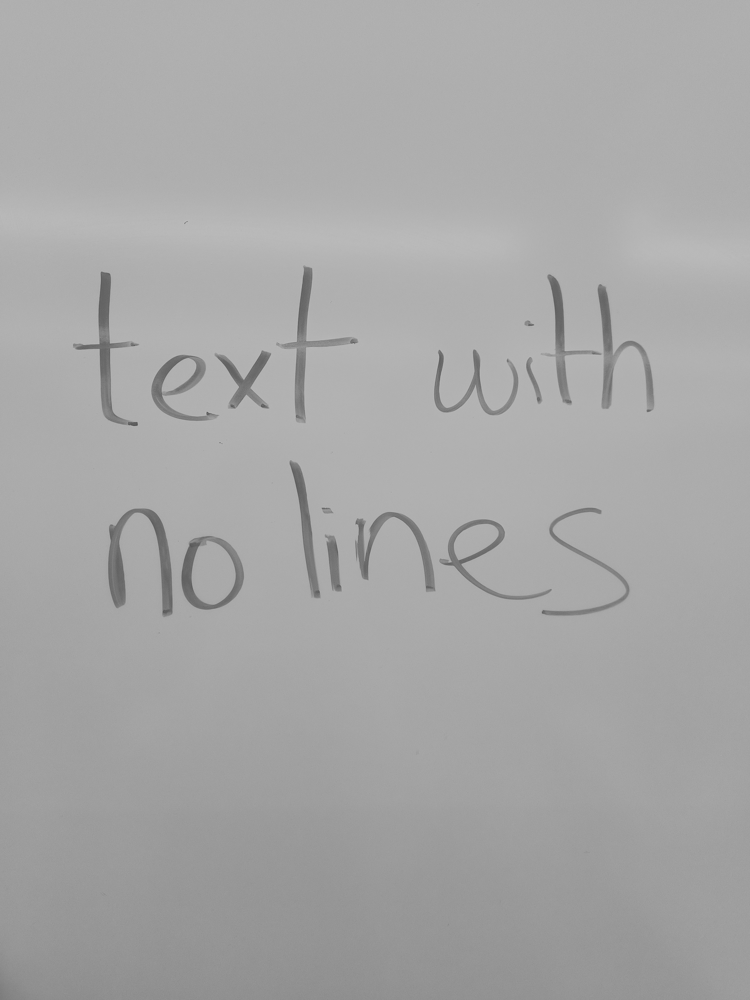

In [ ]:
nolines = '/content/drive/MyDrive/Colab Notebooks/CS98/Inputs/nolines.jpg'

im_nolines = cv2.imread(nolines, 0)
im_display(im_nolines, colab=True)

In [ ]:
# code for dominant colors from: https://stackoverflow.com/a/64600498
def get_dominant_colors(im):
    # # handle images with different number of channels
    if len(im.shape) == 2:  # grayscale image has no third channel
        im = cv2.cvtColor(im, cv2.COLOR_GRAY2RGB)

    image = np.resize(im, (150, 150))  # thumbnail reduces time
    ar = np.asarray(im)
    shape = ar.shape
    ar = ar.reshape(np.product(shape[:2]), shape[2]).astype(float)



    # # handle images with different number of channels
    # if len(im.shape) == 3:  # color image has a third channel
    #    ar = ar.reshape(np.product(shape[:2]), shape[2]).astype(float)
    # else:  # grayscale images have no third channel
    #     ar = ar.reshape(np.product(shape[:2])).astype(float)        

    kmeans = sklearn.cluster.MiniBatchKMeans(
        n_clusters=10,
        init="k-means++",
        max_iter=20,
        random_state=1000  # makes it deterministic
    ).fit(ar)

    codes = kmeans.cluster_centers_

    vecs, _dist = scipy.cluster.vq.vq(ar, codes)  # assign codes
    counts, _bins = np.histogram(vecs, len(codes))  # count occurrences

    # get colors in order of dominance
    colors = []
    for i in np.argsort(counts)[::-1]:
        colors.append(tuple([int(code) for code in codes[i]]))
    return colors 


def get_contrast(im):
    colors = get_dominant_colors(im)

    max = colors[0]
    min = colors[0]

    for c in colors:
        if sum(c) > sum(max):
            max = c
        elif sum(c) < sum(min):
            min = c

    return min, max  # lighter color, darker color

print("res:")

get_contrast(im_nolines)

res:


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


((107, 107, 107), (179, 179, 179))

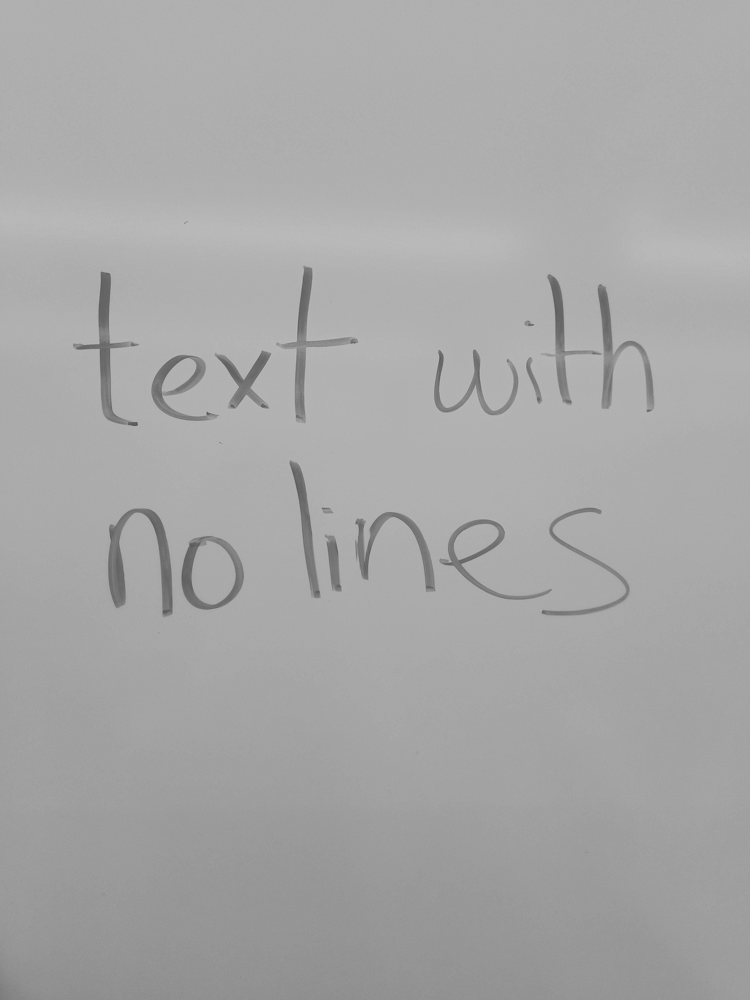

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(107, 107, 107) (179, 179, 179)


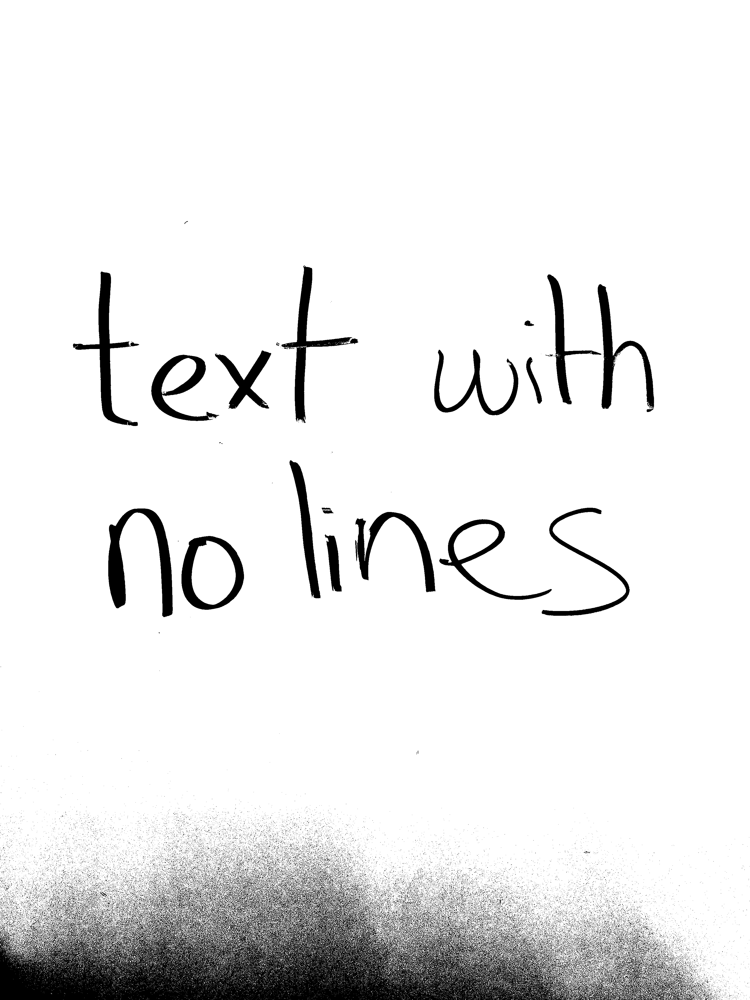

In [ ]:
def assign_ink_level_color_range(im):
    """
    Function to assign ink levels in an image. 
    Assumes that pixels depict either paper color or ink color.

    Get the color range in the image and linearly interpolate
    across the pixels to assign ink levels.

    Input: im, image loaded by OpenCV

    Desired Output: shading map which is another image, 
    np.array the same size as original im with 
    every pixel represented by a float between 0 and 1.
    0 is the paper and boundary between paper and ink
    1 is the intensity of the ink color
    """
    #im = im_rescale(im, 0.5)  # downsize the image by half

    new_im = np.zeros((im.shape[0], im.shape[1], 1), np.uint8)

    if len(im.shape) == 2:  # grayscale image has no third channel
        im_col = cv2.cvtColor(im, cv2.COLOR_GRAY2BGR)  # RGB
        im_display(im_col, colab=True)

    # get the light color of the paper and the dark color of the ink
    light, dark = get_contrast(im)
    print(light, dark)
    
    # check the color intensity of the point
    for x in range(im.shape[0]):
        for y in range(im.shape[1]):

            # inside the color range
            if dark[0] - 30 < im[x][y]:
               new_im[x][y] = 255
            else:
                new_im[x][y] = 0 # white color to display

    im_display(new_im, colab=True)
    return new_im


res = assign_ink_level_color_range(im_nolines)